# Advanced Lane Finding

To find the lane in a better way compared to the previous project, we now have the below pipelines:

In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pdb
import pickle
import os
import glob
from pathlib import Path
from moviepy.editor import VideoFileClip
from IPython.display import HTML
%matplotlib inline

## 1. Camera Calibration and Distortion Correction

Calibration of camera is required as the output of the camera with lenses are always distorted. In order to undistort the image, the camera matrix and distortion co-effecients are needed to be computed. This is done with the help of opencv API (cv2.calibrateCamera). In order to calibrate the camera, different images of the same object - Chessboard is taken from different angles. Luckily, for this project, those images are already present in camera_cal directory. These images are used to find the corners with cv2.findChessboardCorners API and then used to pass to the calibrateCamera API to produce mtx and dist. This needs to be calculated only once as they dont change. So, the values are stored in the pickle files 'mtx.p' and 'dist.p'. If those pickle files are not there, once the calibrate_undistort function is called, they are created and then the global variable mtx and dist are updated with it.

Using the obtained mtx and dist values, an image can be corrected from its distortion with the help of cv2.undistort API.

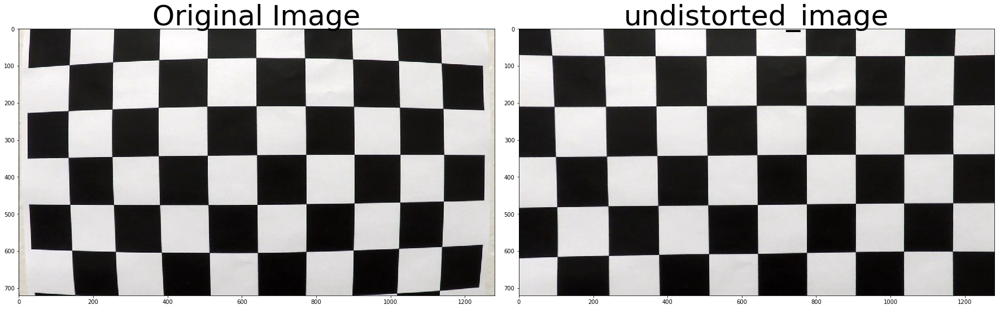

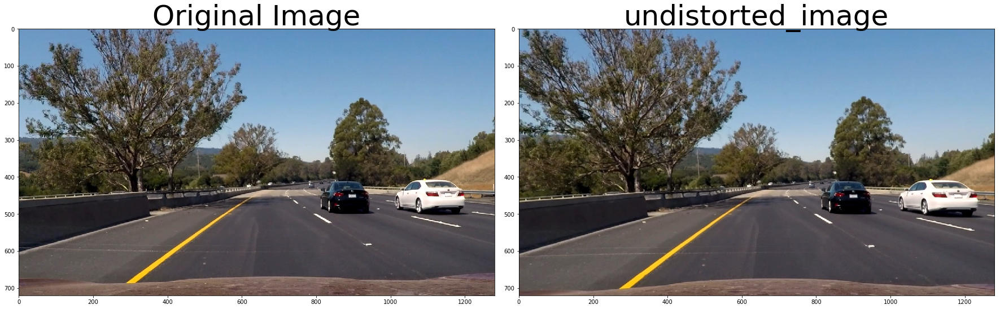

In [2]:
def find_corners(image):
    ''' Takes the chessboard image and finds the corners and appends it to image points '''
    # Convert to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)

    if ret is True:
        imgpoints.append(corners)
        objpoints.append(objp)
        return cv2.drawChessboardCorners(image, (nx, ny), corners, ret)


def calibrate_camera(img):
    ''' Calibrates the camera with object and image points and 
    then creates a pickle file of mtx and dist '''
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img.shape[1::-1], None, None)
    pickle.dump(mtx, open("mtx.p", "wb"))
    pickle.dump(dist, open("dist.p", "wb"))
    return mtx, dist


def undistort(image, mtx, dist):
    ''' Takes the image and returns the undistorted image '''
    undst = cv2.undistort(image, mtx, dist, None, mtx)
    return undst


def display_plot(original_img, output_image, output_img_name,
                 output_path='output_images/undistort.jpg', save_image=False):
    ''' Takes the image and plots as comparison with original image '''
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(original_img)
    ax1.set_title('Original Image', fontsize=50)
    ax2.imshow(output_image)
    ax2.set_title(output_img_name, fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    plt.show()
    if save_image:        
        f.savefig(output_path)

    
def calibrate_undistort(test_image_path, output_image_path='output_images/undistort.jpg', display_plt=False):
    ''' Takes the calibration image path and then finds the corners, calibrates the camera, 
    creates the pickle files if not existing and  then returns the undistorted image'''
    test_image = mpimg.imread(test_image_path)
    exists = os.path.isfile('dist.p')

    if exists:
        mtx = pickle.load(open("mtx.p", "rb"))
        dist = pickle.load(open("dist.p", "rb"))
    else:
        # Make a list of calibration images
        file_names = glob.glob('camera_cal/calibration*.jpg')
        for file_name in file_names:
            img = mpimg.imread(file_name)
            find_corners(img)
        mtx, dist = calibrate_camera(test_image)

    undistorted_image = undistort(test_image, mtx, dist)

    if display_plt:
        display_plot(test_image, undistorted_image, 'undistorted_image', output_image_path, True)

    return undistorted_image


def undistort_image(img):
    ''' Takes an image and returns the undistorted image 
        with the help of global variable mtx and dist 
        computed from calibration '''
    return cv2.undistort(img, mtx, dist, None, mtx)


# prepare object points for 9x6 chessboard images
nx = 9
ny = 6

objpoints = []
imgpoints = []

# Create points from 0,0,0 to 8,5,0
objp = np.zeros((nx*ny, 3), np.float32)
objp[:, :2] = np.mgrid[0:nx, 0:ny].T.reshape(-1, 2)

undistorted_image = calibrate_undistort('camera_cal/calibration1.jpg', 'output_images/chessboard_undistort.jpg', True)
undistorted_image = calibrate_undistort('test_images/test6.jpg', 'output_images/test_image_undistort.jpg', True)

# Pickle file will be created once the calibrate_undistort is called.
# It is now loaded to global variable mtx and dist for future usage
mtx = pickle.load(open("mtx.p", "rb"))
dist = pickle.load(open("dist.p", "rb"))

## 2. Thresholding
### a. Gradient Thresholding

There are different ways to filter an image to look for only lane lines, gradient thresholding is one of them. For absoulte sobel thresholding, it can be seen that the gradients taken in both the x and the y directions detect the lane lines and pick up other edges. Taking the gradient in the x direction emphasizes edges closer to vertical. Alternatively, taking the gradient in the y direction emphasizes edges closer to horizontal. However, just sobel thresholding is not enough as it picks up many other edges as well. So, taking the magnitude of the gradient and also the direction of the gradient is required.  Finally, taking a combination of all these gradients by tweaking with the threshold values, lanes were fairly detected. Except that the second image, where the yellow lines are on the concrete road, none of the threshold values could get those lines. So, a different strategy is required to find those lines. The function "combined_gradient_threshold" creates a binary image by taking gradient threshold on sobelx, sobely, magnitude and direction.

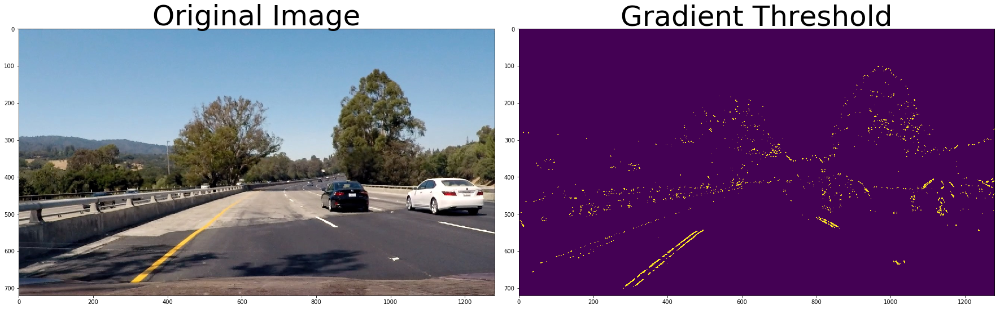

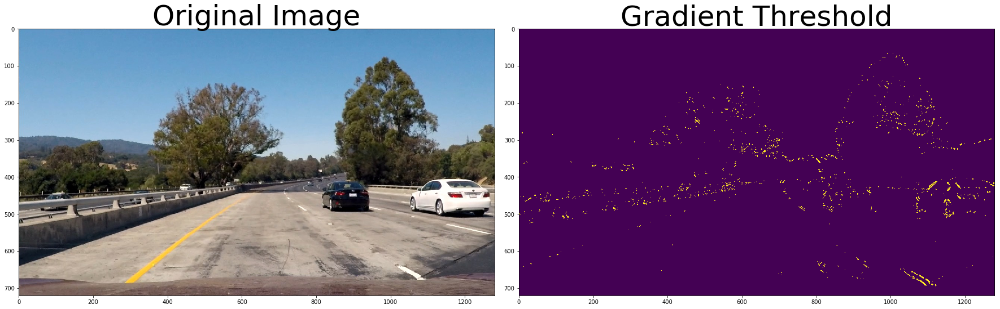

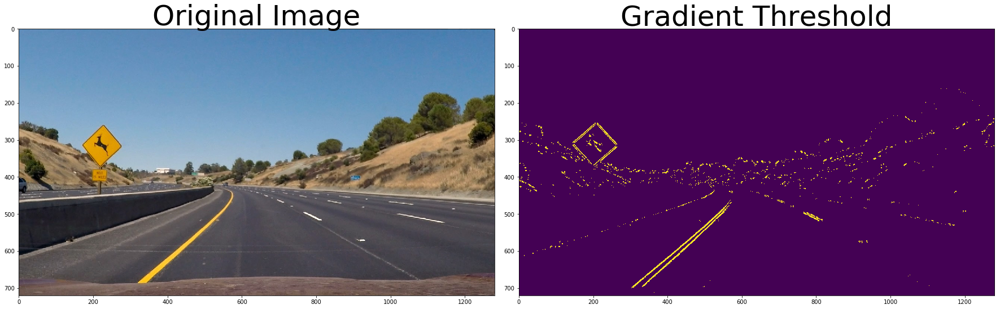

In [3]:
def abs_sobel_thresh(img, orient='x', thresh=(0, 255)):
    ''' Function taken from the lecture. It generates a binary output by 
        taking a sobel x or y based on the orient '''
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Apply x or y gradient with the OpenCV Sobel() function
    # and take the absolute value
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1))
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Create a copy and apply the threshold
    binary_output = np.zeros_like(scaled_sobel)
    # Here I'm using inclusive (>=, <=) thresholds, but exclusive is ok too
    binary_output[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1

    # Return the result
    return binary_output


def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    ''' Function taken from the lecture. It generates a binary output by 
        taking a sobel x and y and then calulates the gradient to use '''
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1

    # Return the binary image
    return binary_output


def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    ''' Function taken from the lecture. It generates a binary output by 
        taking a sobel x and y based on the orient '''
    # Grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1

    # Return the binary image
    return binary_output


def combined_gradient_threshold(image):
    ''' Takes an RGB image and computes several gradients to remove non-lane pixels
    '''
    # Choose a Sobel kernel size
    ksize = 7 # Choose a larger odd number to smooth gradient measurements

    # Apply each of the thresholding functions
    gradx = abs_sobel_thresh(image, orient='x', thresh=(55, 255))
    grady = abs_sobel_thresh(image, orient='y', thresh=(55, 255))
    mag_binary = mag_thresh(image, sobel_kernel=ksize, mag_thresh=(55, 255))
    dir_binary = dir_threshold(image, sobel_kernel=ksize, thresh=(0.7, 1.1))
    combined = np.zeros_like(dir_binary)
    combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
    return combined


def display_transformed_files(method, output_name, num_of_files=3):   
    ''' Takes a method name, undistorts 'num_of_files' number of test images 
        and then calls this method for transformation and then displays the 
        output based on the files
    ''' 
    file_names = glob.glob('test_images/test*.jpg')
    for counter, file_name in enumerate(file_names):
        if counter < num_of_files:
            img = mpimg.imread(file_name)
            undistorted_image = undistort_image(img)
            color_trans_img = method(undistorted_image)
            display_plot(img, color_trans_img, output_name, 
                         'output_images/' + output_name + '.jpg', True)
        else:
            break


display_transformed_files(combined_gradient_threshold, 'Gradient Threshold')

### b. Color Transform

As the yellow lines on concrete road were not detectable with gradient thresholding, we shall use the color space information to detect those lines. With HLS color transform, the (s) saturation channel seemed to contain the relavant data. However, with just the s channel it was not working for all the images, so HSV color transformation was also considered. The value (v) channel of HSV also had relevant data. So, a combination of these two transforms with a little tweaking of the threshold values helped to identify lane lines for most of the images. The function "combined_color_transform" provides a binary image by combining the output of both HSV and HLS transforms.

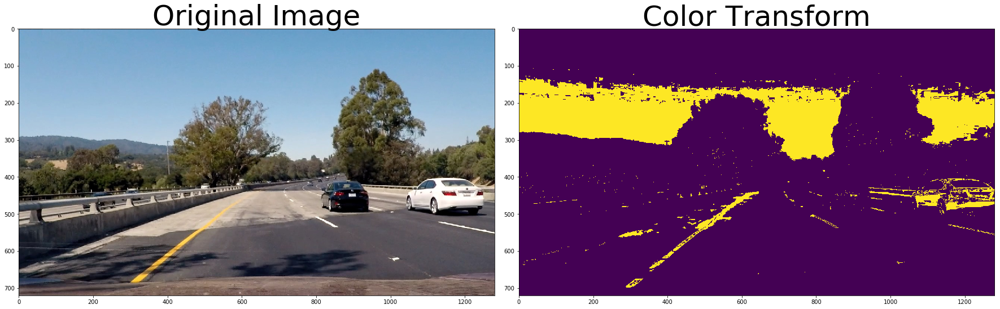

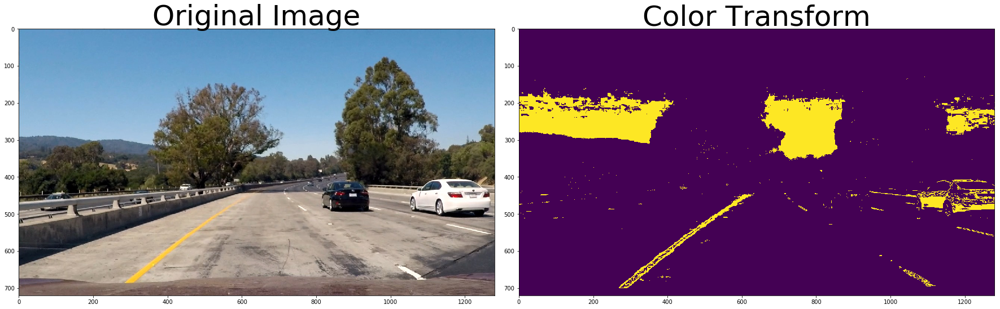

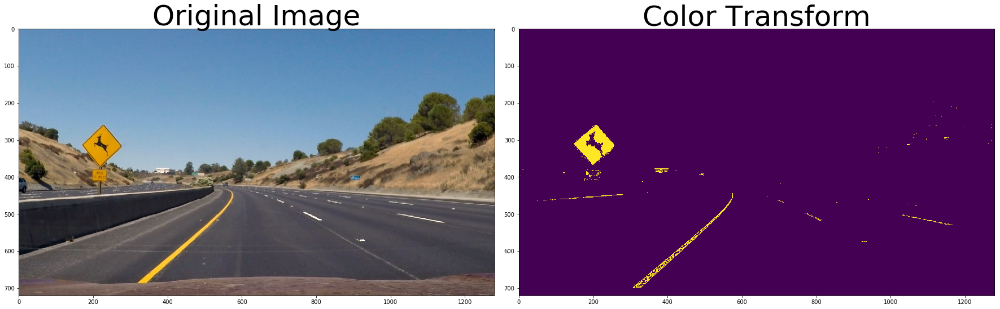

In [4]:
def hls_color_transform(img, hls_thresh=(0, 255)):
    ''' Takes an image, converts to HLS and uses thresholds to output required image
    '''
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    
    s_channel = hls[:,:,2]
    s_binary_img = np.zeros_like(s_channel)
    s_binary_img[(s_channel > hls_thresh[0]) & (s_channel < hls_thresh[1])] = 1
  
    return s_binary_img


def hsv_color_transform(img, hsv_thresh=(0, 255)):
    ''' Takes an image, converts to HSV and uses thresholds to output required image
    '''
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
      
    v_channel = hsv[:,:,2]
    v_binary_img = np.zeros_like(v_channel)
    v_binary_img[(v_channel > hsv_thresh[0]) & (v_channel < hsv_thresh[1])] = 1
    
    return v_binary_img


def combined_color_transform(img):
    ''' Takes an image, converts to HLS and HSV and returns a combined binary image
    '''
    hls_binary_img = hls_color_transform(img, (205, 215))
    hsv_binary_img = hsv_color_transform(img, (215, 255))
    out = np.zeros_like(hls_binary_img)
    out[(hls_binary_img == 1) | (hsv_binary_img == 1)] = 1
    return out

            
display_transformed_files(combined_color_transform, 'Color Transform')

### c. Combining Gradient and Color Transforms

Combining the output of both gradient and color transforms provided the best results compared to just considering one of them. The function "combined_gradient_and_color_threshold" takes in the image and outputs a binary image by using both gradient thresholding and color transform

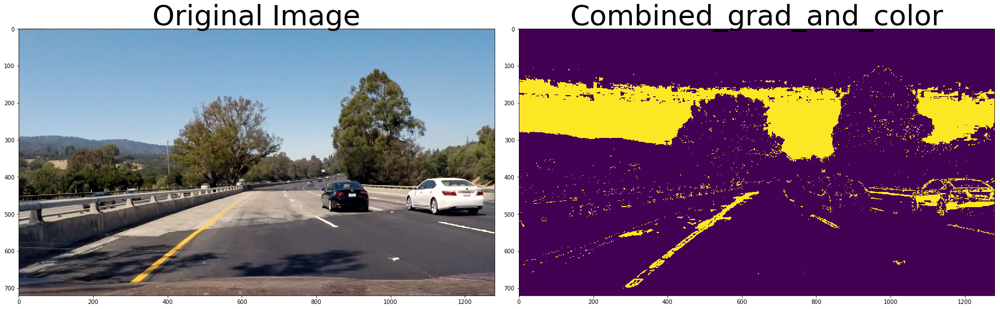

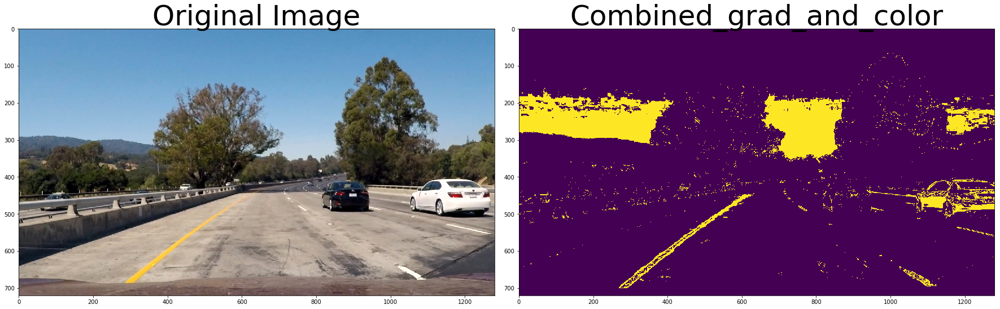

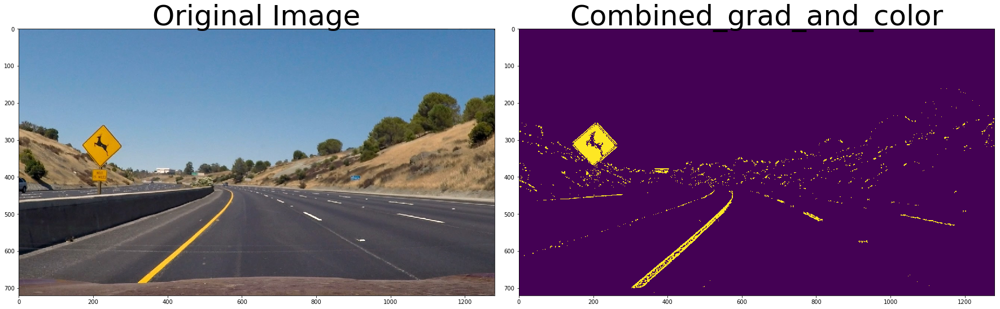

In [5]:
def combined_gradient_and_color_threshold(img):
    ''' Takes an image and outputs a binary image by using both gradient thresholding and color transform
    '''
    hls_hsv_binary_img = combined_color_transform(img)
    grad_binary_img = combined_gradient_threshold(img)
    out = np.zeros_like(hls_hsv_binary_img)
    out[(grad_binary_img == 1) | (hls_hsv_binary_img == 1)] = 1
    return out


display_transformed_files(combined_gradient_and_color_threshold, 'Combined_grad_and_color')

## 3. Perspective Transform

A perspective transform maps the points in a given image to different, desired, image points with a new perspective. The perspective transform that we are interested in is the bird’s-eye view transform that let’s us view a lane from above. This si required as it helps us in calculating the lane curvature. In order to get the bird's eye view of an image, transformation matrix is required and this can be obtained by calling the OpenCV API cv2.getPerspectiveTransform. However, it requires source and destination points to find the transformation matrix. The source points are chosen in a way that it represents a trapezoidal shape around the straight lane lines that would represent a rectangle when looking down on the road from above. In the same way, the destination points are chosen in a way that the straight lines can be covered by its bird's eye view. Each of these points are carefully looked at and selected from the image with the help of plot graph. Once these array of points are formed, transformation matrix is then found with the help of cv2.getPerspectiveTransform and the inverse transformation matrix is found by switching the dst and src points. Once the matrix is found, it is then used to warp perspective to produce a warped image with the help of cv2.warpPerspective API. The matrices once found, will not hcange much. So, a global variable tranform_mtx and inv_tranform_mtx holds the matrix data which is used at a later point.

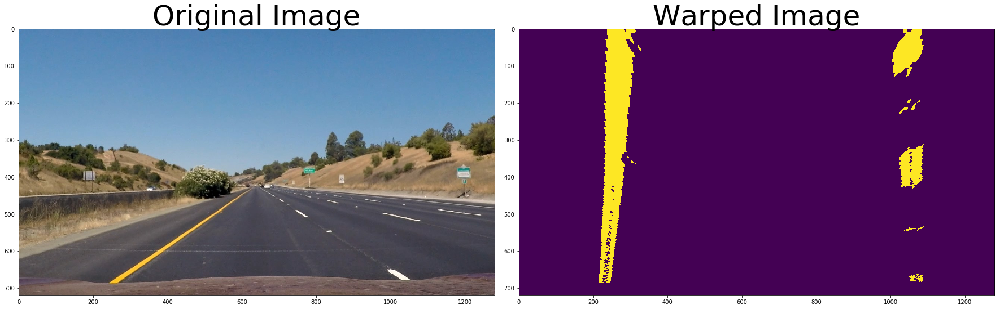

In [6]:
img = mpimg.imread('test_images/straight_lines1.jpg')
undist = undistort_image(img)
thresh_img = combined_gradient_and_color_threshold(undist)

dst = np.float32([(200, 0), (1100, 0), (200, 670), (1100, 670)])
src = np.float32([(570, 460), (710, 460), (250, 670), (1055, 670)])

tranform_mtx = cv2.getPerspectiveTransform(src, dst)
inv_tranform_mtx = cv2.getPerspectiveTransform(dst, src)

warped = cv2.warpPerspective(thresh_img, tranform_mtx, img.shape[1::-1], flags=cv2.INTER_LINEAR)
display_plot(img, warped, 'Warped Image', 'output_images/warped_image.jpg', True)

## 4. Find Lanes and Measure Curvature

After the warped image is generated with only the lane lines, next step is to simplify the pixel data to two polynomials - right and left lane lines. In order to do that, a histogram of the bottom half of the image is taken and its peak before the midpoint and after the midpoint is found out. This peak is the left and right lane lines. A sliding window is created for these lines with a defined margins and windows. Once this is done, extract the x and y co -ordinates of these lines which are then used to do a polynomial fit. Then generate x and y values for plotting which is finally used to create a pollygon to fit the entire lane. The generated polygon is then colored red for our convenience and then warped back to the original stage with the help of inverse transformation matrix.

The x and y co-ordinates obtained from this is actually in pixel space and it needs to be converted to real world space. 
Considering with the US regulations where the lane is about 30 meters long and 3.7 meters wide, the meters per pixel in x and y dimensions are defined as 3.7/700 and 30/720 respectively. With the help of these values, we can obtain the real world space values as shown in the function "measure_curvature_real". The curvature may vary slightly between left and right curve, so taking an average felt to be more effective. Also, the offset from the center is calulated by finding the camera center and the image center and then multiplying with the xm_per_pix as shown in the function "calculate_offset_and_add_text". These values are then overlayed onto the image with the help of cv2.putText API.

The radius of curvature at any point x of the function x=f(y) is given as follows:
Rcurve =((1+(2Ay+B)^2)^3/2)/|2A|
where A and B are coefficients of the second order polynomial

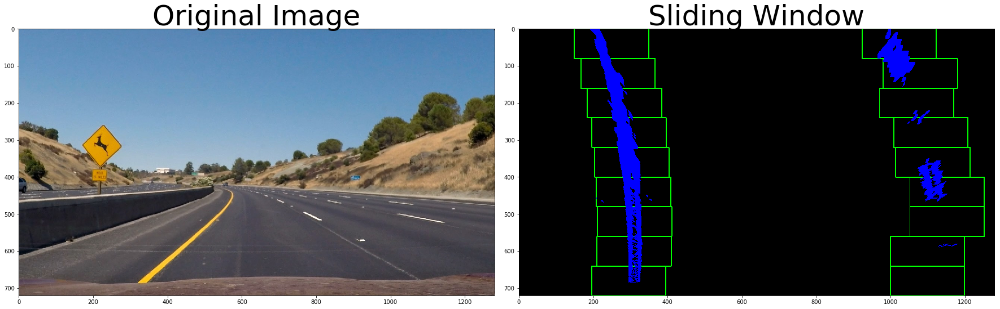

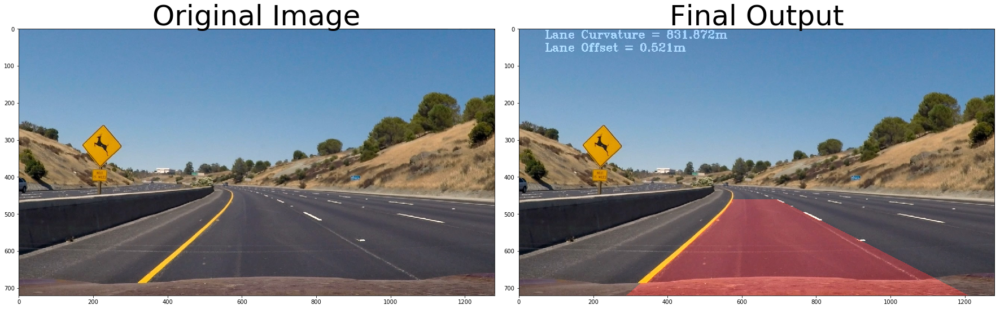

In [7]:
# Define conversions in x and y from pixels space to meters
ym_per_pix = 30/720 # meters per pixel in y dimension
xm_per_pix = 3.7/700 # meters per pixel in x dimension
 
    
def measure_curvature_real(ploty, leftx, lefty, rightx, righty):
    ''' Function taken from the lecture. Calculates the curvature of polynomial 
        functions in meters '''
    left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2) 
    
    # Define y-value where we want radius of curvature
    # We'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)
    
    # Calculation of R_curve (radius of curvature)
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    lane_curvature = np.mean([left_curverad, right_curverad])
     
    return lane_curvature


def calculate_offset_and_add_text(img, lane_curvature, left_fitx, right_fitx):
    ''' Calculates the offset from the center and then adds the text onto the image.
    Took some help from https://github.com/thedch/advanced-lane-line-tracking '''    
    camera_ctr = (left_fitx[-1] + right_fitx[-1])/2
    diff_from_ctr = (camera_ctr - img.shape[1]/2) * xm_per_pix
        
    # Add text to image about the curvature and the offset from center
    cv2.putText(img, 'Lane Curvature = ' + str(round(lane_curvature, 3))+'m',
        (70,25), cv2.FONT_HERSHEY_TRIPLEX, 1, (255,255,255), 2)
    
    cv2.putText(img, 'Lane Offset = ' + str(abs(round(diff_from_ctr, 3)))+'m',
        (70,60), cv2.FONT_HERSHEY_TRIPLEX, 1, (255,255,255), 2)
    return img


def find_lane_pixels(binary_warped):    
    ''' Function taken from the lecture. It takes in warped image 
        and finds the lanes and returns it '''    
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 9
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),
        (win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),
        (win_xright_high,win_y_high),(0,255,0), 2) 
                
        # Identify the nonzero pixels in x and y within the window #
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)   
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    return leftx, lefty, rightx, righty, out_img


def fit_polynomial(binary_warped, visualize = False):
    ''' Function taken from the lecture. It takes in warped image, 
        finds the lanes, colors the found lane and then returns it '''    
    # Find our lane pixels first
    leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped)

    # Fit a second order polynomial to each using `np.polyfit`
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
   
    # Create a polygon out of the generated x and y values.
    left_fit_area = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    right_fit_area = np.array([np.flipud(np.transpose(np.vstack([right_fitx,ploty])))])
    
    # Combine the points to make a single array
    all_points = np.hstack((left_fit_area, right_fit_area))
    
    ## Enable the below to visualize the lane borders as well ##    
    if visualize:
        out_img[lefty, leftx] = [0, 0, 255] # purple
        out_img[righty, rightx] = [0, 0, 255] # brown
        display_plot(input, out_img, 'Sliding Window', 'output_images/sliding_window.jpg', True)
    
    # Fill the created polygon/lane with red color
    color_lane_img = np.zeros_like(out_img)
    cv2.fillPoly(color_lane_img, np.int_([all_points]), (255, 0, 0))
    
    # Use the inverse transformation matrix to warp the image
    out_img = cv2.warpPerspective(color_lane_img, inv_tranform_mtx, binary_warped.shape[1::-1], flags=cv2.INTER_LINEAR)
 
    lane_curvature = measure_curvature_real(ploty, leftx, lefty, rightx, righty)
    output_with_text = calculate_offset_and_add_text(out_img, lane_curvature, left_fitx, right_fitx)
    
    return output_with_text


def combine_with_original_image(original_img, out_with_text):
    ''' Combines two images and returns it '''   
    return cv2.addWeighted(original_img, 1, out_with_text, 0.3, 0)


def process_image(img, visualize=False):
    ''' Function to undistort, generate binary image by gradient and color thresholding, 
    find the lane lines, color the lane and then combine with the original image to 
    produce the final output'''   
    undist_img = undistort_image(img)
    binary_img = combined_gradient_and_color_threshold(undist_img)
    binary_warped = cv2.warpPerspective(binary_img, tranform_mtx, img.shape[1::-1], flags=cv2.INTER_LINEAR)
    out_img = fit_polynomial(binary_warped, visualize)
    final_output = combine_with_original_image(img, out_img)
    return final_output


input = mpimg.imread('test_images/test2.jpg')
output = process_image(input, True)
display_plot(input, output, 'Final Output', 'output_images/final_output.jpg', True)

## Complete pipeline

The complete pipeline requires camera calibration, using the camera matrix and distortion co-effecient to undistort the image, color thresholding to obtain filtered lane image, warping the image with transformation matrix to find histograms, sliding window approach to find the lane lines, warping it back with inverse transformation matrix, finding the curvature and then combining this output with the original image to produce the final output

In [8]:
output_video = 'output_images/project_output.mp4'
video_clip = VideoFileClip("project_video.mp4")
# Enable the below code to run only 5s of the project video
#output_video = 'output_images/project_5s_output.mp4'
#video_clip = VideoFileClip('project_video.mp4').subclip(0,5)
output_clip = video_clip.fl_image(process_image)
%time output_clip.write_videofile(output_video, audio=False)

[MoviePy] >>>> Building video output_images/project_output.mp4
[MoviePy] Writing video output_images/project_output.mp4


100%|█████████▉| 1260/1261 [10:41<00:00,  1.99it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_images/project_output.mp4 

CPU times: user 6min 51s, sys: 1min 38s, total: 8min 30s
Wall time: 10min 44s


In [9]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(output_video))

In [10]:
challenge_video = 'output_images/challenge_output.mp4'
video_clip = VideoFileClip('challenge_video.mp4').subclip(0,4)
#video_clip = VideoFileClip("challenge_video.mp4")
output_clip = video_clip.fl_image(process_image)
%time output_clip.write_videofile(challenge_video, audio=False)

[MoviePy] >>>> Building video output_images/challenge_output.mp4
[MoviePy] Writing video output_images/challenge_output.mp4


100%|██████████| 120/120 [00:55<00:00,  2.07it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_images/challenge_output.mp4 

CPU times: user 37.6 s, sys: 8.92 s, total: 46.5 s
Wall time: 59.1 s


In [11]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(challenge_video))

## Discussion

There are a lot of improvments which can be brought into the lane finding technique. The color and gradient thresholding fails for different shades of the same road as in challenge video. It shall also fail for different weather like snow, rain. Also, the perspective transform points chosen are manual and might work only for these roads, however if there is something like s curved roads, perspective transformation might fail. So, we need a dynamic way of finding those points and the thresholding. Also, the sliding window approach is the slowest and takes so much time to compute this entire video, but in real time we need answers very fastly. So, using search from prior approach would make it much faster. There might be other approaches as well.

## References

1. https://github.com/thedch/advanced-lane-line-tracking
2. https://github.com/oargueta3/SDCND-Project-4-Advanced-Lane-Finding/blob/master/Advanced%20Lane%20Detection%20-%20Oscar%20Argueta.ipynb
3. https://github.com/dkarunakaran/carnd-advanced-lane-lines-p4
4. https://github.com/darienmt/CarND-Advanced-Lane-Lines-P4
5. http://stackoverflow.com/